# Example of utilizing a function to visualize basic Ultralytics model inference results and managing overlapping image crops:

In [ ]:
!pip install patched_yolo_infer

In [2]:
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
import numpy as np

from patched_yolo_infer import (
    visualize_results_usual_yolo_inference,
    get_crops,
)

# Inference visualization:

### 1. function __visualize_results_usual_yolo_inference__:


    Visualizes the results of usual YOLO or YOLO-seg inference on an image

    Args:
        img (numpy.ndarray): The input image in BGR format.
        model: The object detection or segmentation model (YOLO).
        imgsz (int): The input image size for the model. Default is 640.
        conf (float): The confidence threshold for detection. Default is 0.5.
        iou (float): The intersection over union threshold for detection. Default is 0.7.
        segment (bool): Whether to perform instance segmentation. Default is False.
        show_boxes (bool): Whether to show bounding boxes. Default is True.
        show_class (bool): Whether to show class labels. Default is True.
        fill_mask (bool): Whether to fill the segmented regions with color. Default is False.
        alpha (float): The transparency of filled masks. Default is 0.3.
        color_class_background (tuple): The background BGR color for class labels. Default is (0, 0, 255) (red).
        color_class_text (tuple): The text BGR color for class labels. Default is (255, 255, 255) (white).
        thickness (int): The thickness of bounding box and text. Default is 4.
        font: The font type for class labels. Default is cv2.FONT_HERSHEY_SIMPLEX.
        font_scale (float): The scale factor for font size. Default is 1.5.
        delta_colors (int): The random seed offset for color variation. Default is 0.
        dpi (int): Final visualization size (plot is bigger when dpi is higher).
        random_object_colors (bool): If True, colors for each object are selected randomly.
        show_confidences (bool): If True and show_class=True, confidences near class are visualized.
        axis_off (bool): If True, axis is turned off in the final visualization.
        show_classes_list (list): If empty, visualize all classes. Otherwise, visualize only classes in the list.
        list_of_class_colors (list/None): A list of tuples representing the colors for each class in BGR format. If provided,  
                    these colors will be used for displaying the classes instead of random colors. The number of tuples
                    in the list must match the number of possible classes in the network.
        inference_extra_args (dict): Dictionary with extra ultralytics inference parameters
        return_image_array (bool): If True, the function returns the image (BGR np.array) instead of displaying it.

    Returns:
        None or np.array if return_image_array==True

## YOLOv8 - detection visualization example:

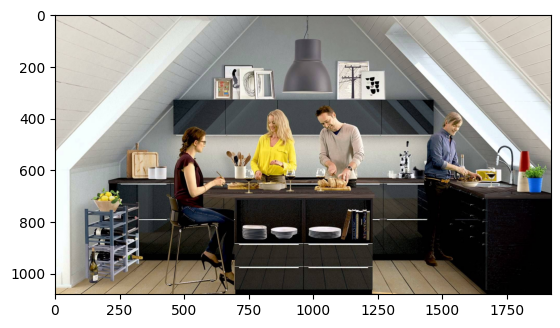

In [60]:
# Load the image
img_path = 'content/kitchen.jpg'
img = cv2.imread(img_path)
plt.imshow(cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB));

Let's load the YOLOv8 detection model and display all detected objects in the image:

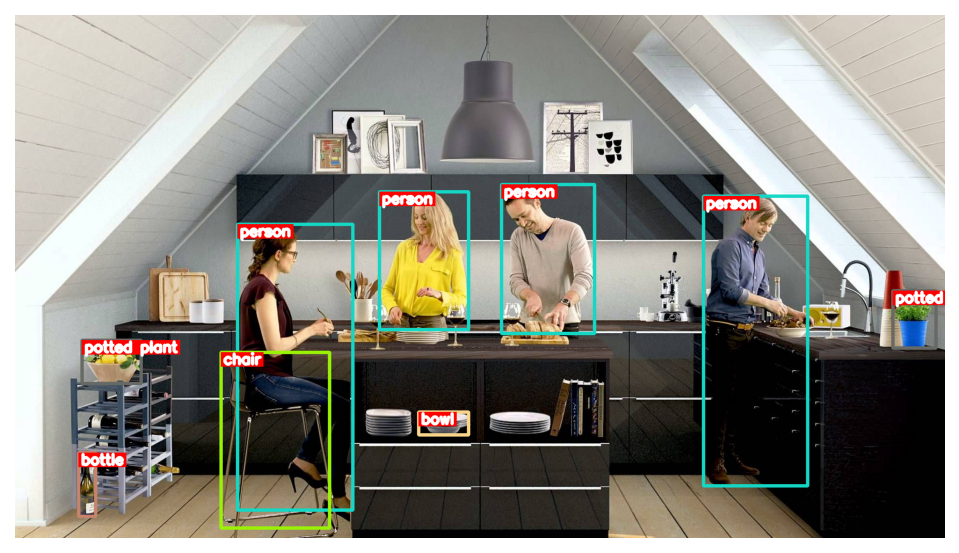

In [10]:
# Load the YOLOv8 model
model = YOLO("yolov8m.pt")  # Make sure the model file is in the correct path

visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    segment=False,
    thickness=5,
    font_scale=1.0,
)

Let's display the confidence values of the predictions and customize the area for the output text:

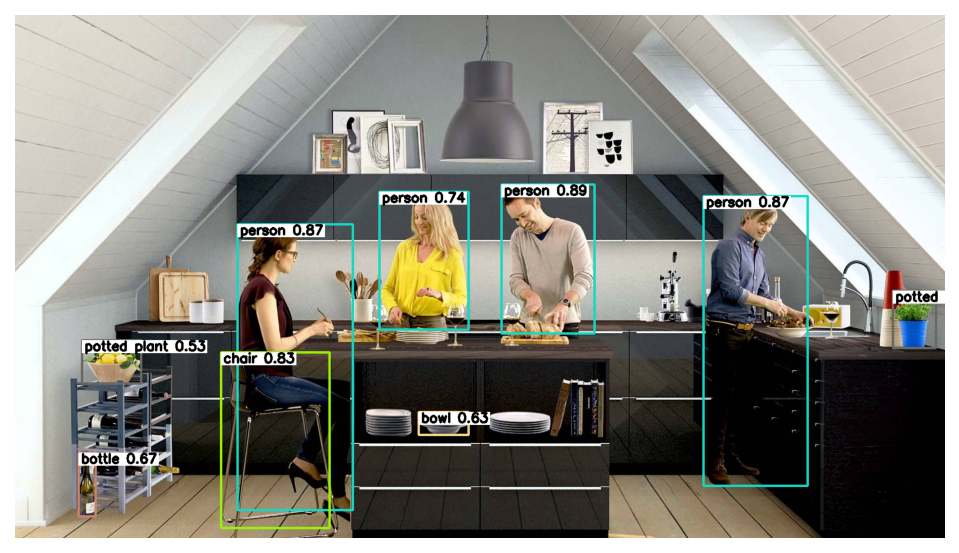

In [18]:
visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    segment=False,
    thickness=3,
    font_scale=0.9,
    show_confidences=True,
    color_class_background=(255, 255, 255),
    color_class_text=(0, 0, 0),
)

Let's limit the number of detectable classes and display only the boxes without additional text:

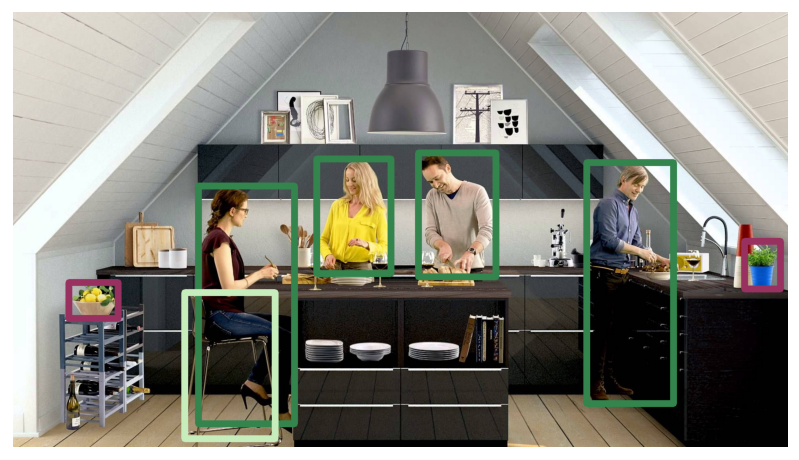

In [40]:
visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    show_classes_list=[0, 56, 57, 58],
    segment=False,
    show_class=False,
    thickness=15,
    delta_colors=20,
    dpi=125,
)

## YOLOv8-seg - instance segmentation vizualization example:

Let's load the YOLOv8-seg instance segmentation model and display the detected boxes and masks, filling the contour inside with 30% transparency:

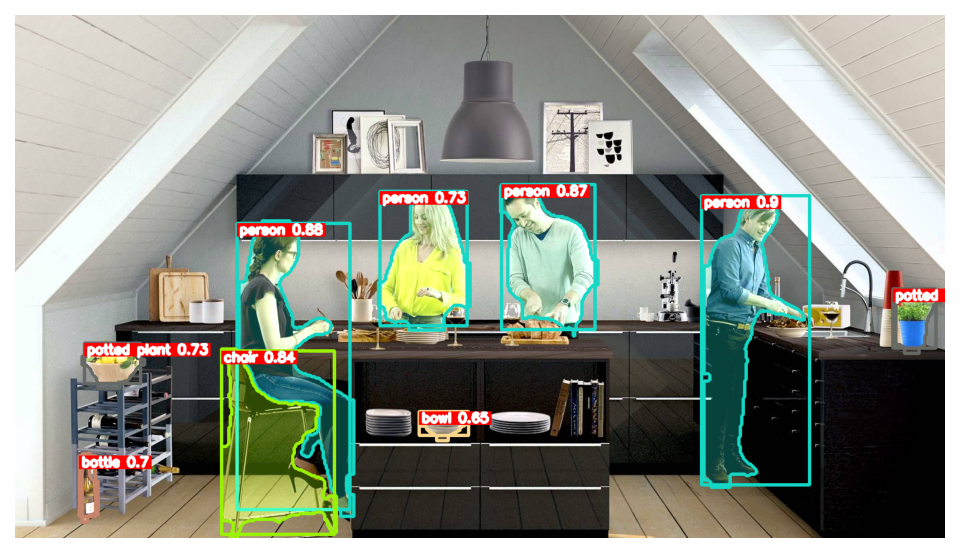

In [44]:
# Load the YOLOv8 model
model = YOLO("yolov8m-seg.pt")  # Make sure the model file is in the correct path

visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    segment=True,
    thickness=5,
    font_scale=0.9,
    fill_mask=True,
    alpha=0.3,
    show_confidences=True,
)


Let's limit the number of classes, display only the masks, and change the random color values for the classes. To increase the accuracy of the contours, let's add an additional parameter with `retina_masks=True`.

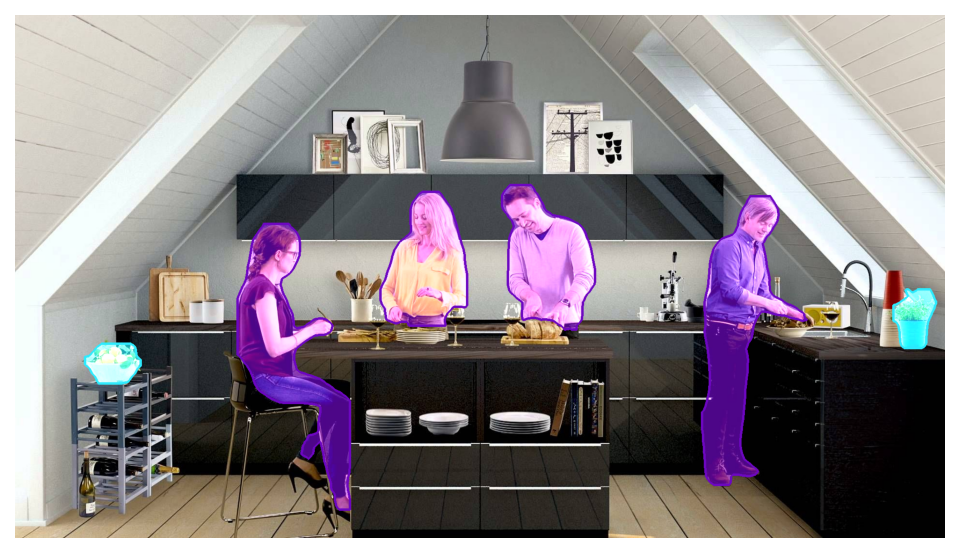

In [65]:
visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    show_classes_list=[0, 58],
    segment=True,
    thickness=3,
    show_boxes=False,
    fill_mask=True,
    alpha=0.7,
    show_class=False,
    delta_colors=25,
    inference_extra_args={'retina_masks':True}
)

---

## YOLOv9 example

In [5]:
img_path = 'content/road.jpg'
img = cv2.imread(img_path)

Let's load the YOLOv9 detection model and display all detected boxes without outputting additional information:

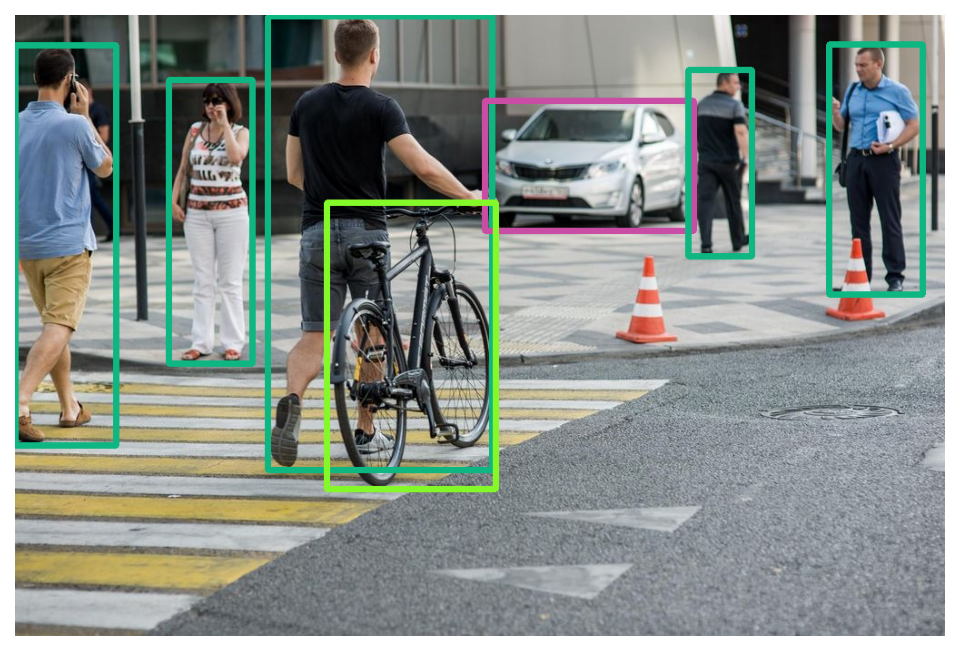

In [75]:
model = YOLO('yolov9c.pt')

visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    segment=False,
    thickness=5,
    delta_colors=5,
    show_class=False,
)

Let's load the YOLOv9-seg instance segmentation model and display the masks, ensuring each object is shown in a different random color:

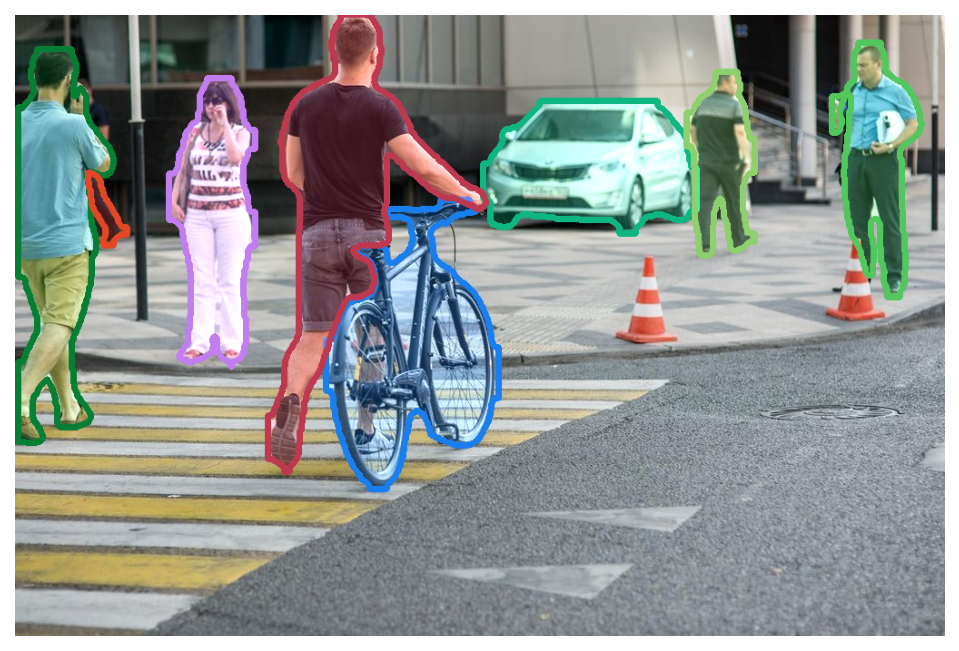

In [6]:
model = YOLO('yolov9c-seg.pt')

visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    segment=True,
    thickness=5,
    delta_colors=5,
    show_class=False,
    show_boxes=False,
    fill_mask=True,
    random_object_colors=True,
)

Let's display only the 'person' and 'bicycle' classes and set the color values for displaying the classes ourselves. We will request to show only the contours of the objects without filling the masks:

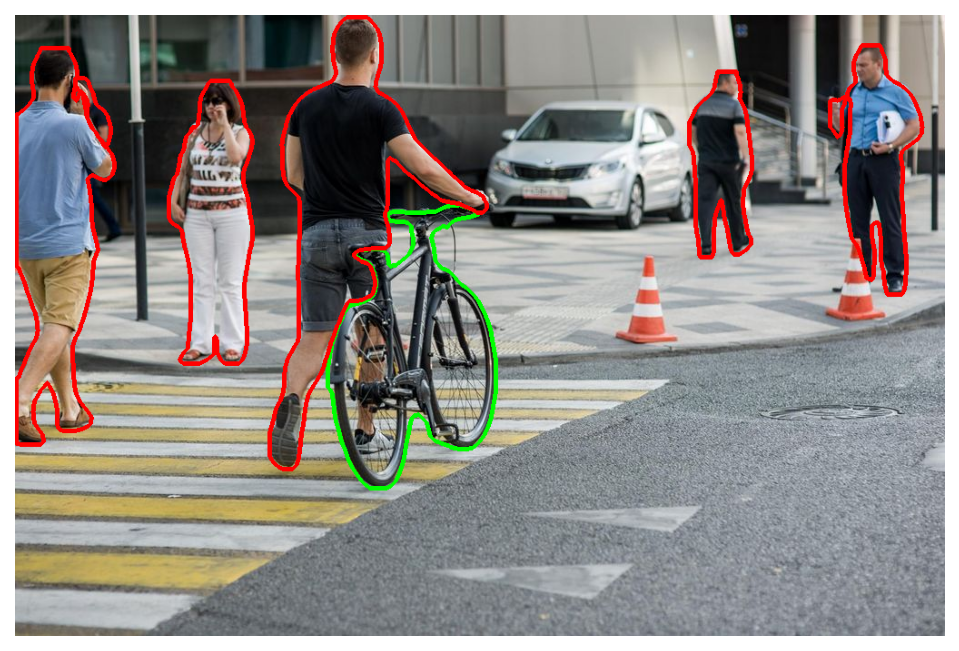

In [10]:
visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.4,
    iou=0.7,
    segment=True,
    show_classes_list=[0, 1],
    list_of_class_colors=[(0,0,255),(0,255,0)],
    inference_extra_args={'retina_masks':True},
    thickness=4,
    show_class=False,
    show_boxes=False,
    fill_mask=False,
)

## SAM example:

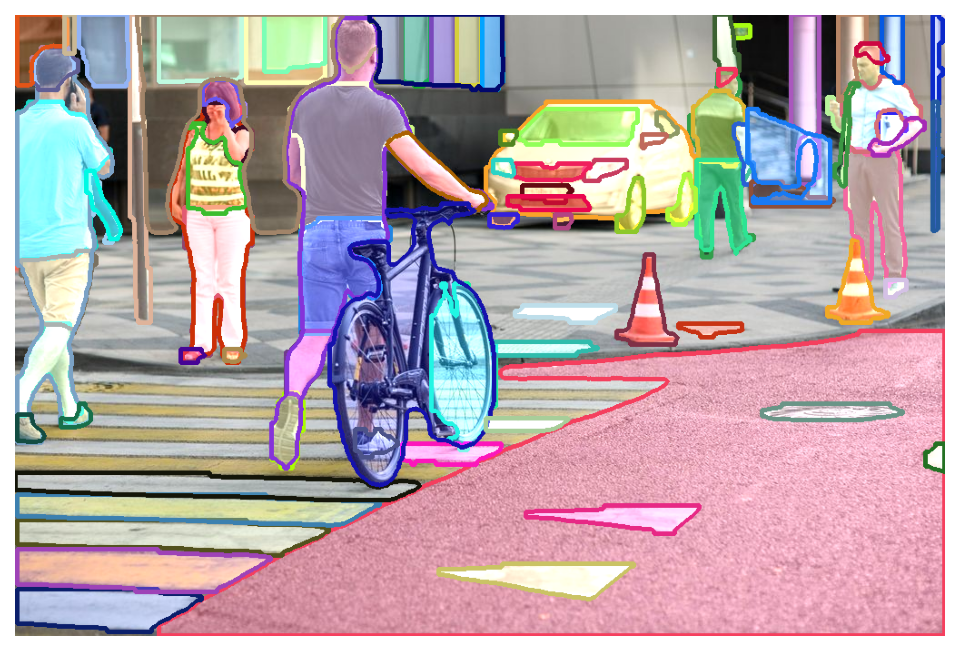

In [80]:
from ultralytics import FastSAM

model = FastSAM('FastSAM-x.pt')

visualize_results_usual_yolo_inference(
    img,
    model,
    imgsz=1024,
    conf=0.35,
    iou=0.7,
    segment=True,
    thickness=4,
    show_boxes=False,
    fill_mask=True,
    alpha=0.4,
    random_object_colors=True,
    show_class=False,
    dpi=150
)

## RTDTR example:

In [ ]:
img_path = 'content/cars.jpg'
img = cv2.imread(img_path)

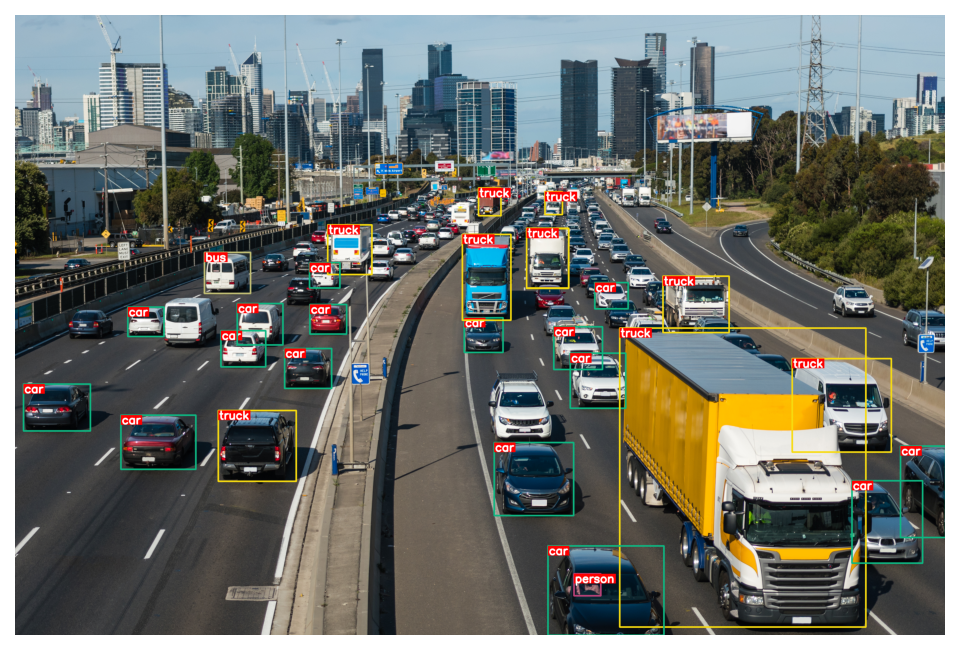

In [ ]:
from ultralytics import RTDETR

# Load a COCO-pretrained RT-DETR-l model
model = RTDETR('rtdetr-l.pt')

visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.5,
    iou=0.7,
    segment=False,
    delta_colors=3,
    thickness=8,
    font_scale=2.0,
)

## How to save the visualization result as an image

use return_image_array=True and then cv2.imwrite

In [ ]:
result = visualize_results_usual_yolo_inference(
    img,
    model,
    conf=0.5,
    iou=0.7,
    segment=False,
    delta_colors=3,
    thickness=8,
    font_scale=2.0,
    return_image_array=True
)
cv2.imwrite('/path/to/destination/image.jpg', result)

---

# Cropping with Overlapping:

### 2. function __get_crops__:


    Preprocessing of the image. Generating crops with overlapping.

    Args:
        image_full (array): numpy array of a BGR image.
        shape_x (int): size of the crop in the x-coordinate.
        shape_y (int): size of the crop in the y-coordinate.
        overlap_x (float, optional): Percentage of overlap along the x-axis
            (how much subsequent crops borrow information from previous ones). Default is 15.
        overlap_y (float, optional): Percentage of overlap along the y-axis
            (how much subsequent crops borrow information from previous ones). Default is 15.
        show (bool): enables the mode to display images using plt.imshow. Default is False.
        save_crops (bool): enables saving generated images. Default is False.
        save_folder (str): folder path to save the images. Default is "crops_folder".
        start_name (str): starting name for saved images. Default is "image".
        resize (bool): If True, the image is resized to fit the last crop exactly.
                       If False, the image is not resized. Default is False.

    Returns:
        data_all_crops (list): List containing cropped images.


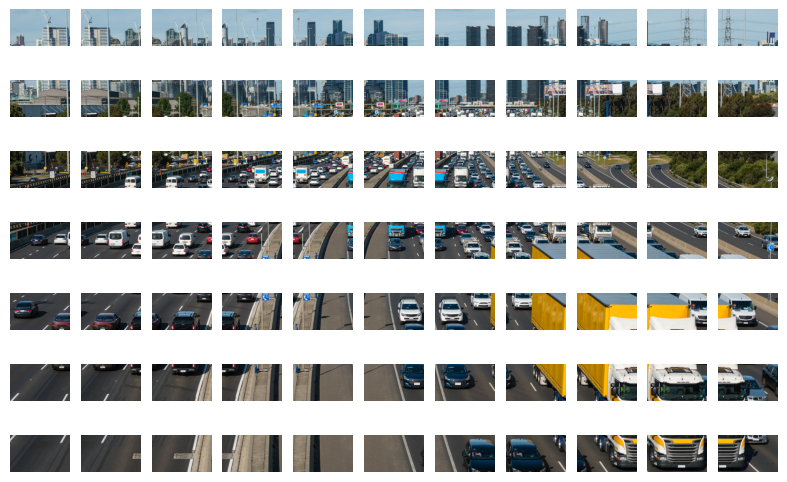

Number of generated images: 77


In [ ]:
img_path = 'content/image-test.jpg'
image = cv2.imread(img_path)

data_all_crops = get_crops(
    image,
    shape_x=800,
    shape_y=500,
    overlap_x=50,
    overlap_y=10,
    show=True,
    save_crops=True,
    start_name="img",
    resize=True,
)

In [ ]:
np.array(data_all_crops).shape

(77, 500, 800, 3)

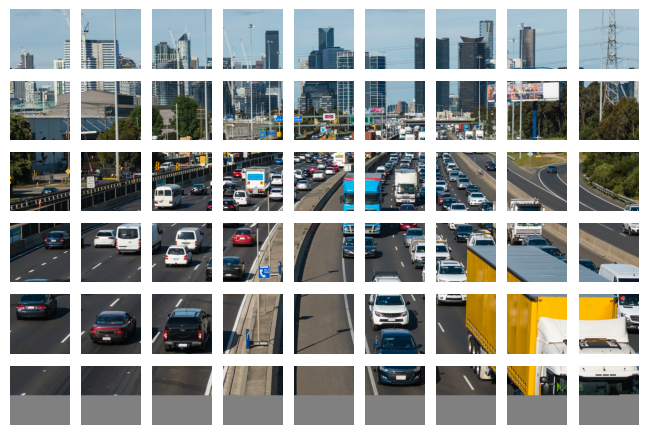

Number of generated images: 54


In [ ]:
data_all_crops = get_crops(image, shape_x=500, shape_y=500, overlap_x=0, overlap_y=0, show=True)

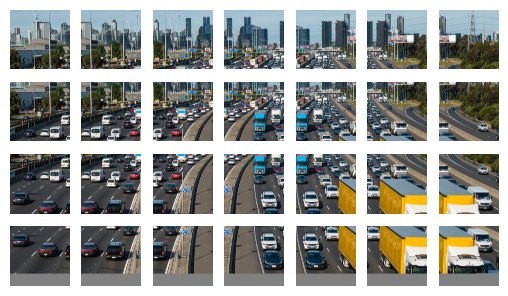

Number of generated images: 28


In [ ]:
data_all_crops = get_crops(image, shape_x=1200, shape_y=1200, overlap_x=50, overlap_y=50, show=True)

Exemple of one outut crop from the list:

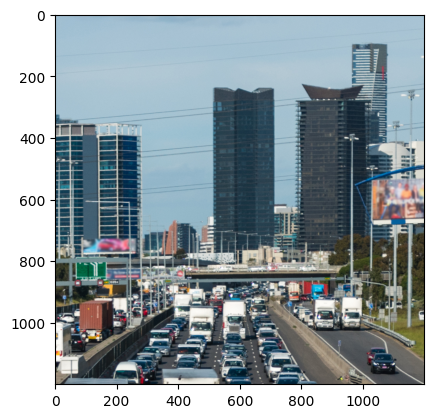

In [ ]:
plt.imshow(cv2.cvtColor(data_all_crops[4].copy(), cv2.COLOR_BGR2RGB));